<a href="https://colab.research.google.com/github/Alz-517/T.A.M_2025-2/blob/Parcial_2/DOOM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 1. Instalar dependencias del sistema
!sudo apt-get update
!sudo apt-get install -y cmake libboost-all-dev libsdl2-dev libopenal-dev timidity wget

# 2. Limpieza TOTAL (Importante para borrar las versiones rotas)
!pip uninstall -y gymnasium gym vizdoom shimmy stable-baselines3 tensorboard

# 3. Instalación LIGERA (Sin '[extra]' para evitar el conflicto de versiones)
!pip install vizdoom gymnasium==0.29.1 stable-baselines3 imageio shimmy --quiet

print("✅ Dependencias instaladas (Modo Seguro - Sin Tensorboard).")

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease                         
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]      
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease                     
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease                 
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease               
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease   
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [6,066 kB]
Get:12 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3,563 kB]
Fetched 9,757

In [ ]:
import time
import importlib

print("🔄 Intentando importar Stable Baselines 3...")

max_retries = 3
for attempt in range(max_retries):
    try:
        from stable_baselines3 import DQN
        from stable_baselines3.common.callbacks import BaseCallback
        from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack
        print("✅ Importación exitosa.")
        break
    except (ImportError, ValueError, AttributeError) as e:
        print(f"⚠️ Intento {attempt+1} fallido: {e}")
        print("   Reintentando en 2 segundos...")
        time.sleep(2)
        # Truco: A veces recargar dependencias ayuda
        try:
            import scipy
            importlib.reload(scipy)
        except:
            pass

# Verificación final
try:
    from stable_baselines3 import DQN
except ImportError:
    raise RuntimeError("❌ No se pudo importar DQN después de varios intentos. El entorno de Kaggle tiene conflictos graves.")

🔄 Intentando importar Stable Baselines 3...
✅ Importación exitosa.


In [ ]:
import os
import gymnasium as gym
import vizdoom.gymnasium_wrapper # <--- ESTA LÍNEA ES MÁGICA: Registra los entornos automáticamente
from vizdoom import scenarios_path # Para encontrar los archivos .cfg

# Definir la ruta exacta del archivo de configuración para evitar ambigüedades
# Esto busca dónde se instaló 'basic.cfg' dentro de Kaggle
config_path = os.path.join(scenarios_path, "basic.cfg")
print(f"Archivo de configuración encontrado en: {config_path}")

# Configurar el entorno
# En lugar de usar el string corto que falló, usamos 'VizdoomBasic-v0'
# PERO nos aseguramos de que el wrapper se haya cargado arriba.
try:
    env = gym.make("VizdoomBasic-v0", render_mode="rgb_array")
    print("¡Entorno cargado exitosamente usando ID estándar!")
except gym.error.NameNotFound:
    print("El ID estándar falló, intentando carga manual con ViZDoom...")
    # Plan B: Si el registro falla, usamos el constructor directo (muy robusto)
    from vizdoom.gymnasium_wrapper import ViZDoomEnv
    env = ViZDoomEnv(
        level=config_path,  # Ruta directa al archivo
        render_mode="rgb_array"
    )
    print("¡Entorno cargado exitosamente usando carga manual!")

# Verificar que funciona
obs, info = env.reset()
print(f"Shape de observación: {obs['screen'].shape if isinstance(obs, dict) else obs.shape}")
print(f"Espacio de acción: {env.action_space}")

Archivo de configuración encontrado en: /usr/local/lib/python3.11/dist-packages/vizdoom/scenarios/basic.cfg


/usr/local/lib/python3.11/dist-packages/vizdoom/gymnasium_wrapper/base_gymnasium_env.py:84: UserWarning: Detected screen format CRCGCB. Only RGB24 and GRAY8 are supported in the Gymnasium wrapper. Forcing RGB24.
  warnings.warn(


¡Entorno cargado exitosamente usando ID estándar!
Shape de observación: (240, 320, 3)
Espacio de acción: Discrete(4)


In [ ]:
from stable_baselines3 import DQN
print("¡Ahora sí funciona!")

¡Ahora sí funciona!


In [ ]:
from gymnasium import ObservationWrapper
from gymnasium.spaces import Box

class VizdoomImageWrapper(ObservationWrapper):
    def __init__(self, env):
        super().__init__(env)
        # Si el entorno original devuelve un diccionario, extraemos 'screen'
        if isinstance(env.observation_space, gym.spaces.Dict):
            self.observation_space = env.observation_space["screen"]
        else:
            self.observation_space = env.observation_space

    def observation(self, observation):
        # Si es diccionario, devolvemos solo la pantalla
        if isinstance(observation, dict) and "screen" in observation:
            return observation["screen"]
        return observation

# Envolvemos el entorno para arreglar el formato de imagen
env = VizdoomImageWrapper(env)

# Verificación final antes de entrenar
obs, _ = env.reset()
print(f"Shape final para la IA: {obs.shape}") # Debe ser (Alto, Ancho, Canales)

Shape final para la IA: (240, 320, 3)


Dimensiones detectadas: (240, 320, 3)
Tipo de dato: uint8


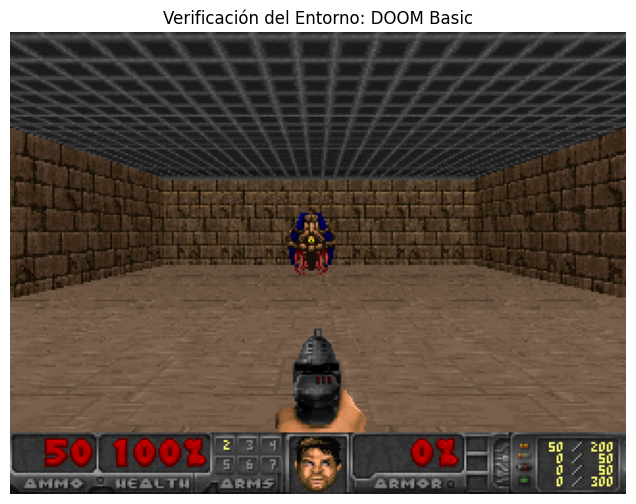

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Reiniciamos el entorno para obtener la observación inicial
obs, info = env.reset()

# 2. Verificación de seguridad para extraer la imagen
# Dependiendo de si ya aplicaste el Wrapper o no, 'obs' puede ser un diccionario o la imagen directa.
if isinstance(obs, dict) and 'screen' in obs:
    screen = obs['screen'] # Si es diccionario, extraemos la pantalla
else:
    screen = obs # Si ya es un array (gracias al wrapper), lo usamos directo

# 3. Mostrar la imagen
print(f"Dimensiones detectadas: {screen.shape}")
print("Tipo de dato:", screen.dtype)

plt.figure(figsize=(8, 6))
plt.imshow(screen)
plt.title("Verificación del Entorno: DOOM Basic")
plt.axis('off') # Quitar ejes para ver mejor
plt.show()

In [ ]:
## BLOQUE DE CÓDIGO 1: Adaptación Final del Entorno (V7 - FINAL ROBUSTO)

from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack
from gymnasium import wrappers as gym_wrappers
from gymnasium.core import ObservationWrapper
from gymnasium.spaces import Box
import numpy as np

# 1. Definir la resolución deseada y número de stacks
RESIZE_SHAPE = (84, 84)
N_STACKS = 4

# --- WRAPPER 1: Para forzar el Box Space estándar (H, W, 3) ---
class ForceImageSpaceWrapper(ObservationWrapper):
    """Fuerza el observation_space a ser Box(H, W, 3, uint8) para satisfacer GrayScaleObservation."""
    def __init__(self, env):
        super().__init__(env)
        # Forzamos un Box(H, W, 3) para la aserción de GrayScale
        obs_shape = env.observation_space.shape
        self.observation_space = Box(
            low=0,
            high=255,
            shape=obs_shape if len(obs_shape) == 3 and obs_shape[-1] == 3 else (240, 320, 3),
            dtype=np.uint8,
        )
    def observation(self, obs):
        return obs

# --- WRAPPER 2: Normalizar y Transponer a (C, H, W) ---
class NormalizeAndTransposeWrapper(ObservationWrapper):
    """Normaliza a [0.0, 1.0] y Transpone a Canales Primero (C, H, W)."""
    def __init__(self, env):
        super().__init__(env)
        obs_shape = self.observation_space.shape # Ahora (84, 84) después de GrayScale/Resize

        # El espacio de observación final es (C, H, W) y float32
        self.observation_space = Box(
            low=0.0,
            high=1.0,
            shape=(1, obs_shape[0], obs_shape[1]), # (1, 84, 84)
            dtype=np.float32,
        )

    def observation(self, obs):
        # 1. Normalizar (asume que la entrada es uint8 o float, lo convierte a [0.0, 1.0] float32)
        obs = obs.astype(np.float32) / 255.0

        # 2. Transponer: (H, W) -> (1, H, W). Esto es la clave.
        return np.expand_dims(obs, axis=0)


# 2. Aplicar la cadena de Wrappers
# a) Asegurar que el espacio de obs. sea HxWx3 Box uint8
env = ForceImageSpaceWrapper(env)

# b) Redimensionar primero para optimizar GrayScale
env = gym_wrappers.ResizeObservation(env, shape=RESIZE_SHAPE)

# c) Escala de Grises (Ahora debe pasar la aserción)
env = gym_wrappers.GrayScaleObservation(env)

# d) Normalizar y Transponer a (C, H, W)
env = NormalizeAndTransposeWrapper(env)

# e) Vectorizar
env = DummyVecEnv([lambda: env])

# f) Pila de Frames (Ahora en formato Canales Primero)
env = VecFrameStack(env, n_stack=N_STACKS, channels_order='first') # <-- CORRECCIÓN CRÍTICA

# ---------------------------------------------
# 3. Verificación
# ---------------------------------------------
print(f"✅ Adaptación de entorno completada.")
# El shape final es (Batch, Canales, Alto, Ancho)
print(f"Shape final del espacio de observación: {env.observation_space.shape}")
print(f"Shape final de acción: {env.action_space}")

obs_stacked = env.reset()

# El shape esperado ahora es (1, 4, 84, 84) -> (Batch, N_STACKS, Alto, Ancho)
print(f"Shape del Frame Apilado (reset): {obs_stacked.shape}")

✅ Adaptación de entorno completada.
Shape final del espacio de observación: (4, 84, 84)
Shape final de acción: Discrete(4)
Shape del Frame Apilado (reset): (1, 4, 84, 84)


In [ ]:
## BLOQUE DE CÓDIGO 2: Definición y Entrenamiento (PRUEBA CORTA - CORREGIDO)

from stable_baselines3 import DQN
import os

# -----------------
# 1. Parámetros de la Prueba
# -----------------
TIMESTEPS_PRUEBA = 100_000
MODELO_NOMBRE = "dqn_doom_basic_prueba"

# -----------------
# 2. Definición del Modelo DQN
# -----------------
model = DQN(
    "CnnPolicy",
    env,
    # Desactiva la normalización interna para aceptar imágenes float32 (Corrección anterior).
    policy_kwargs=dict(normalize_images=False),
    learning_rate=0.0001,
    buffer_size=50000,
    learning_starts=10000,
    batch_size=32,
    gamma=0.99,
    train_freq=4,
    target_update_interval=1000,
    exploration_fraction=0.1,
    verbose=1,
    # REMOVIDO: tensorboard_log="./dqn_doom_log/", # Soluciona el ImportError
)

print("🧠 Modelo DQN definido. Iniciando prueba de entrenamiento...")
print(f"Se entrenará por {TIMESTEPS_PRUEBA} pasos.")

# -----------------
# 3. Entrenamiento (¡PRUEBA RÁPIDA!)
# -----------------
model.learn(
    total_timesteps=TIMESTEPS_PRUEBA,
    log_interval=10
)

# 4. Guardar el modelo entrenado (de la prueba)
model.save(MODELO_NOMBRE)
print(f"✅ Entrenamiento de prueba finalizado. Modelo guardado como '{MODELO_NOMBRE}.zip'")

Using cuda device
🧠 Modelo DQN definido. Iniciando prueba de entrenamiento...
Se entrenará por 100000 pasos.
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10       |
|    fps              | 616      |
|    time_elapsed     | 2        |
|    total_timesteps  | 1839     |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 20       |
|    fps              | 623      |
|    time_elapsed     | 5        |
|    total_timesteps  | 3494     |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 30       |
|    fps              | 625      |
|    time_elapsed     | 8        |
|    total_times

In [ ]:
## BLOQUE DE CÓDIGO 3: Entrenamiento Largo (Producción)

from stable_baselines3 import DQN

# -----------------
# 1. Parámetros
# -----------------
TIMESTEPS_PRODUCCION = 2_000_000
MODELO_NOMBRE_FINAL = "dqn_doom_final"
MODELO_ANTERIOR = "dqn_doom_basic_prueba"

# -----------------
# 2. Carga y Continuación del Entrenamiento
# -----------------
try:
    # Debemos cargar con la configuración de policy_kwargs para la CNN
    model = DQN.load(MODELO_ANTERIOR, env=env, custom_objects={'policy_kwargs': dict(normalize_images=False)})
    print(f"Modelo '{MODELO_ANTERIOR}' cargado exitosamente. Continuaremos el entrenamiento.")
except Exception as e:
    print(f"⚠️ No se pudo cargar el modelo de prueba. Usando el modelo definido en Bloque 2.")

print("🧠 Iniciando entrenamiento largo...")
print(f"Se entrenará por {TIMESTEPS_PRODUCCION} pasos ADICIONALES.")

# -----------------
# 3. Entrenamiento (¡Producción!)
# -----------------
model.learn(
    total_timesteps=TIMESTEPS_PRODUCCION,
    reset_num_timesteps=False,
    log_interval=50
)

# 4. Guardar el modelo final
model.save(MODELO_NOMBRE_FINAL)
print(f"✅ Entrenamiento finalizado. Modelo guardado como '{MODELO_NOMBRE_FINAL}.zip'")

Modelo 'dqn_doom_basic_prueba' cargado exitosamente. Continuaremos el entrenamiento.
🧠 Iniciando entrenamiento largo...
Se entrenará por 2000000 pasos ADICIONALES.
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 450      |
|    fps              | 277      |
|    time_elapsed     | 1        |
|    total_timesteps  | 100312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.276    |
|    n_updates        | 22577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 500      |
|    fps              | 271      |
|    time_elapsed     | 36       |
|    total_timesteps  | 109876   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.04   

In [ ]:
## BLOQUE DE CÓDIGO 4: Evaluación y Demostración (CORREGIDO)

from stable_baselines3 import DQN
import time

# 1. Cargar el modelo final
MODELO_A_EVALUAR = "dqn_doom_final"

print(f"Cargando modelo '{MODELO_A_EVALUAR}.zip' para evaluación...")

# Cargar el modelo final, asegurando que use la configuración correcta
loaded_model = DQN.load(
    MODELO_A_EVALUAR,
    env=env,
    # Mantenemos el policy_kwargs para cargar la arquitectura de red correctamente
    custom_objects={'policy_kwargs': dict(normalize_images=False)}
)

# 2. Ejecutar la demostración
EPISODES_TO_RUN = 5

for episode in range(EPISODES_TO_RUN):
    obs = env.reset()
    # La variable 'done' se inicializa a False
    done = False
    score = 0
    start_time = time.time()

    print(f"\n--- 🎮 Episodio {episode + 1} Comenzado ---")

    while not done:
        # Predecir la mejor acción (deterministic=True)
        action, _ = loaded_model.predict(obs, deterministic=True)

        # Realizar la acción
        # === CORRECCIÓN CLAVE ===
        # Desempaquetamos 4 valores: obs, reward, done_array (terminado O truncado), info
        obs, reward, done_array, info = env.step(action)
        # El valor de 'done' (booleano) es el primer elemento del array done_array
        done = done_array[0]
        # ========================

        score += reward[0] # El reward es el primer elemento de la lista

    print(f"--- 🏁 Episodio {episode + 1} Terminado en {time.time() - start_time:.2f}s ---")
    print(f"Puntaje total (Recompensa): {score:.2f}")

# 3. Limpieza
env.close()

Cargando modelo 'dqn_doom_final.zip' para evaluación...

--- 🎮 Episodio 1 Comenzado ---
--- 🏁 Episodio 1 Terminado en 0.05s ---
Puntaje total (Recompensa): 79.00

--- 🎮 Episodio 2 Comenzado ---


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/buffers.py:242: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 11.29GB > 8.43GB
  warnings.warn(


--- 🏁 Episodio 2 Terminado en 0.06s ---
Puntaje total (Recompensa): 70.00

--- 🎮 Episodio 3 Comenzado ---
--- 🏁 Episodio 3 Terminado en 0.06s ---
Puntaje total (Recompensa): 68.00

--- 🎮 Episodio 4 Comenzado ---
--- 🏁 Episodio 4 Terminado en 0.05s ---
Puntaje total (Recompensa): 77.00

--- 🎮 Episodio 5 Comenzado ---
--- 🏁 Episodio 5 Terminado en 0.08s ---
Puntaje total (Recompensa): 61.00


In [ ]:
# Importaciones necesarias
import gymnasium as gym
# <-- AHORA IMPORTAMOS DummyVecEnv Y VecFrameStack DESDE SB3.COMMON.VEC_ENV
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack
from stable_baselines3 import DQN
import imageio.v3 as iio
from IPython.display import Video, display as ipy_display
import numpy as np
from gymnasium.core import ObservationWrapper
from gymnasium.spaces import Box

# Definición de las clases de wrappers (necesarias si no están en el kernel actual)
# [Se mantiene la definición de los wrappers VizdoomImageWrapper, ForceImageSpaceWrapper,
# GrayScaleObservation, ResizeObservation, NormalizeAndTransposeWrapper aquí...]

# --- Redefinición de Wrappers para asegurar que estén disponibles en esta celda ---
# El kernel de Python podría haber perdido las definiciones de las clases anteriores.
# Las incluimos de nuevo para garantizar la ejecución.

class VizdoomImageWrapper(gym.ObservationWrapper):
    """Extrae la imagen 'screen' de la observación de ViZDoom si es un dict."""
    def __init__(self, env):
        super().__init__(env)
        if isinstance(env.observation_space, gym.spaces.Dict):
            self.observation_space = env.observation_space["screen"]
        if self.observation_space.dtype != np.uint8:
             self.observation_space = gym.spaces.Box(
                low=0, high=255, shape=self.observation_space.shape, dtype=np.uint8
            )

    def observation(self, observation):
        if isinstance(observation, dict) and "screen" in observation:
            return observation["screen"]
        return observation

class ForceImageSpaceWrapper(ObservationWrapper):
    """Fuerza el observation_space a ser Box(H, W, 3, uint8) para satisfacer GrayScaleObservation."""
    def __init__(self, env):
        super().__init__(env)
        obs_shape = env.observation_space.shape
        self.observation_space = Box(
            low=0,
            high=255,
            shape=obs_shape if len(obs_shape) == 3 and obs_shape[-1] == 3 else (240, 320, 3),
            dtype=np.uint8,
        )
    def observation(self, obs):
        return obs

class NormalizeAndTransposeWrapper(ObservationWrapper):
    """Normaliza a [0.0, 1.0] y Transpone a Canales Primero (C, H, W)."""
    def __init__(self, env):
        super().__init__(env)
        obs_shape = self.observation_space.shape
        self.observation_space = Box(
            low=0.0,
            high=1.0,
            shape=(1, obs_shape[0], obs_shape[1]),
            dtype=np.float32,
        )

    def observation(self, obs):
        obs = obs.astype(np.float32) / 255.0
        return np.expand_dims(obs, axis=0)
# --- Fin de Redefinición de Wrappers ---


# Función Helper para obtener el entorno base
def get_raw_vizdoom_env(vec_env):
    """Accede a la instancia del entorno base de ViZDoom para obtener el render RGB."""
    current_env = vec_env.envs[0]
    while hasattr(current_env, 'env'):
        current_env = current_env.env
    return current_env

# -----------------------------------------------------
# 1. Configuración del Video
# -----------------------------------------------------
VIDEO_SCENARIO_FILENAME = "doom_multi_enemy_combat.mp4"
SCENARIO_ID = 'VizdoomDefendCenter-v0'
EPISODES_TO_WATCH = 2
VIDEO_FPS = 15.0

# -----------------------------------------------------
# 2. Configuración y Creación del NUEVO Entorno
# -----------------------------------------------------

print(f"🔄 Creando nuevo entorno de combate: {SCENARIO_ID}...")

# 2a. Crea el entorno base del nuevo escenario
temp_env = gym.make(SCENARIO_ID, render_mode='rgb_array')

# 2b. Replicar la CADENA DE WRAPPERS EXACTA
temp_env = VizdoomImageWrapper(temp_env)
temp_env = ForceImageSpaceWrapper(temp_env)
temp_env = gym.wrappers.ResizeObservation(temp_env, shape=(84, 84))
temp_env = gym.wrappers.GrayScaleObservation(temp_env)
temp_env = NormalizeAndTransposeWrapper(temp_env)

# 2c. Vectorizar y FrameStack (Simula el entorno final)
temp_env = DummyVecEnv([lambda: temp_env])
# === CORRECCIÓN CLAVE: VecFrameStack importado de stable_baselines3.common.vec_env ===
temp_env = VecFrameStack(temp_env, n_stack=4, channels_order='first')
# ======================================================================================

print(f"✅ Nuevo entorno temporal configurado. Shape de entrada: {temp_env.observation_space.shape}")

# -----------------------------------------------------
# 3. Cargar el Modelo y Ejecución
# -----------------------------------------------------
MODELO_A_EVALUAR = "dqn_doom_final"
loaded_model = DQN.load(MODELO_A_EVALUAR, env=temp_env, custom_objects={'policy_kwargs': dict(normalize_images=False)})

frames = []
base_env_renderer = get_raw_vizdoom_env(temp_env)

print(f"--- 📹 Iniciando captura en {SCENARIO_ID} para {EPISODES_TO_WATCH} episodios ---")

for episode in range(EPISODES_TO_WATCH):
    obs = temp_env.reset()
    done = False
    score = 0

    print(f"  Capturando Episodio {episode + 1}...")

    while not done:
        action, _ = loaded_model.predict(obs, deterministic=True)
        obs, reward, done_array, info = temp_env.step(action)
        done = done_array[0]
        score += reward[0]

        try:
             frame = base_env_renderer.render()
             frames.append(frame)
        except Exception as e:
             print(f"⚠️ Error de renderizado: {e}. Saltando...")
             break

    print(f"--- 🏁 Episodio {episode + 1} finalizado. Puntaje: {score:.2f} ---")

# -----------------------------------------------------
# 4. Guardar y Mostrar el Video MP4
# -----------------------------------------------------
temp_env.close()

if frames:
    print(f"Guardando {len(frames)} frames como '{VIDEO_SCENARIO_FILENAME}'...")

    iio.imwrite(
        VIDEO_SCENARIO_FILENAME,
        frames,
        fps=VIDEO_FPS,
        quality=8
    )

    print("✅ Video guardado. Reproduciendo...")
    ipy_display(Video(VIDEO_SCENARIO_FILENAME, embed=True, html_attributes='controls loop'))

else:
    print("❌ No se capturó ningún frame o el agente murió inmediatamente. No se puede generar el video.")

🔄 Creando nuevo entorno de combate: VizdoomDefendCenter-v0...
✅ Nuevo entorno temporal configurado. Shape de entrada: (4, 84, 84)
--- 📹 Iniciando captura en VizdoomDefendCenter-v0 para 2 episodios ---
  Capturando Episodio 1...
--- 🏁 Episodio 1 finalizado. Puntaje: 1.00 ---
  Capturando Episodio 2...
--- 🏁 Episodio 2 finalizado. Puntaje: 2.00 ---
Guardando 712 frames como 'doom_multi_enemy_combat.mp4'...
✅ Video guardado. Reproduciendo...
